<a href="https://colab.research.google.com/github/bild12/EspIA/blob/main/Tecnicas_Avanzadas_G4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://www.javeriana.edu.co/recursosdb/20125/5571273/escudo-circular.png" alt="Your Image" style="float:left;">
</div><h1>Pontificia Universidad Javeriana</h1>

---


<h2>Evaluación Sumativa</h2>
<h1>Taller Aplicación Técnicas Avanzadas IC en la solución de un problema práctico</h1>

---


*Inteligencia Computacional *

**Especialización en Inteligencia Artificial**

**Pontificia Universidad Javeriana**

### Integrantes:
Manuel Huérfano Castro - huerfanom@javeriana.edu.co <br>
Felipe Rangel - feliperangel@javeriana.edu.co <br>
Jessica Barreto - barretoj@javeriana.edu.co <br>
Johan Sanchez - johanw-sanchez@javeriana.edu.co <br>
Ivette Lopez - lopezdbi@javeriana.edu.co <br>

In [ ]:
%%capture
!pip install ydata-profiling
# Importación de librerías necesarias para el proyecto
import gdown

# Manipulación de datos
import pandas as pd
import numpy as np
import ydata_profiling as pp

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Preprocesamiento y escalado
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Modelos de Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import tensorflow as tf
from tensorflow.keras import layers, Model

# Evaluación de modelos
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, log_loss
from sklearn.metrics import accuracy_score, recall_score, f1_score, log_loss

# Configuración de visualización
%matplotlib inline
sns.set_style('whitegrid')

# Análisis y Modelado del Dataset de Detección de Humo

## Paso 1: Comprensión del Negocio
### 1.1 Objetivo del Problema
El objetivo es desarrollar un modelo de predicción capaz de determinar si una alarma de incendio se activará basándose en las lecturas de diversos sensores IoT. Esto permitirá optimizar los sistemas de detección de incendios y mejorar los tiempos de respuesta ante posibles emergencias.

### 1.2 Descripción del Contexto
El dataset utilizado contiene variables obtenidas de sensores IoT que miden características como temperatura, humedad, concentración de CO2, presión atmosférica, entre otros. La variable objetivo es `Fire Alarm`, que indica si la alarma se activó (1) o no (0). El proyecto busca aprovechar estas variables para crear modelos de IA que predigan la activación de la alarma de manera precisa.

## Paso 2: Comprensión de los Datos
### 2.1 Exploración de los Datos
Para familiarizarnos con el dataset, realizaremos un análisis exploratorio inicial. Esto incluye:
- **Estadísticas descriptivas** para comprender la media, mediana, desviación estándar y otros valores relevantes de las variables.
- **Distribución de la variable objetivo** para identificar si el dataset está balanceado entre las clases (alarma activada vs no activada).



In [ ]:
# Descargamos el archivo
file_id = '1ywO_FDU_HddUQL4QtbcR0gQEwaBZYrOO'

# Formar el enlace de descarga
url = f'https://drive.google.com/uc?id={file_id}'

# Descargar el archivo usando gdown, y especificar el nombre del archivo de salida
filename = 'smoke_detection_iot.csv'  # Cambia el nombre y la extensión si necesitas otro formato
gdown.download(url, filename, quiet=False)

# cargar los datos en data frame
df = pd.read_csv(filename)

Downloading...
From: https://drive.google.com/uc?id=1ywO_FDU_HddUQL4QtbcR0gQEwaBZYrOO
To: /content/smoke_detection_iot.csv
100%|██████████| 5.83M/5.83M [00:00<00:00, 34.2MB/s]


In [ ]:
df

,Unnamed: 0,UTC,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
0,0,1654733331,20.000,57.36,0,400,12306,18520,939.735,0.00,0.00,0.00,0.000,0.000,0,0
1,1,1654733332,20.015,56.67,0,400,12345,18651,939.744,0.00,0.00,0.00,0.000,0.000,1,0
2,2,1654733333,20.029,55.96,0,400,12374,18764,939.738,0.00,0.00,0.00,0.000,0.000,2,0
3,3,1654733334,20.044,55.28,0,400,12390,18849,939.736,0.00,0.00,0.00,0.000,0.000,3,0
4,4,1654733335,20.059,54.69,0,400,12403,18921,939.744,0.00,0.00,0.00,0.000,0.000,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62625,62625,1655130047,18.438,15.79,625,400,13723,20569,936.670,0.63,0.65,4.32,0.673,0.015,5739,0
62626,62626,1655130048,18.653,15.87,612,400,13731,20588,936.678,0.61,0.63,4.18,0.652,0.015,5740,0
62627,62627,1655130049,18.867,15.84,627,400,13725,20582,936.687,0.57,0.60,3.95,0.617,0.014,5741,0
62628,62628,1655130050,19.083,16.04,638,400,13712,20566,936.680,0.57,0.59,3.92,0.611,0.014,5742,0


### Profile para hacer análisis previo de los datos

In [ ]:
profile= pp.ProfileReport(df,explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Paso 3: Preparación de los Datos

### 3.1 Limpieza de Datos
- **Revisión de valores nulos**: Asegúrate de que no haya valores nulos en el dataset.
- **Manejo de valores atípicos (outliers)**: Utiliza visualizaciones como diagramas de caja para detectar y tratar outliers que puedan afectar el desempeño del modelo.

### 3.2 Selección y Creación de Características
- **Análisis de correlación**: Usa la matriz de correlación creada en el Paso 2 para identificar qué características son más relevantes para predecir la variable objetivo (`Fire Alarm`).
- **Características redundantes**: Eliminar características que estén muy correlacionadas entre sí o que no aporten información relevante.

### 3.3 Transformación de Datos
- **Escalado de características**: Escala las características numéricas usando `StandardScaler` para estandarizarlas. Esto ayuda a que los modelos, especialmente SVM y redes neuronales, funcionen mejor al normalizar el rango de las características.

### 3.4 División de Datos
- **División en entrenamiento y prueba**: Divide el conjunto de datos en sets de entrenamiento y prueba para evaluar el desempeño del modelo.


Unnamed: 0        0
UTC               0
Temperature[C]    0
Humidity[%]       0
TVOC[ppb]         0
eCO2[ppm]         0
Raw H2            0
Raw Ethanol       0
Pressure[hPa]     0
PM1.0             0
PM2.5             0
NC0.5             0
NC1.0             0
NC2.5             0
CNT               0
Fire Alarm        0
dtype: int64


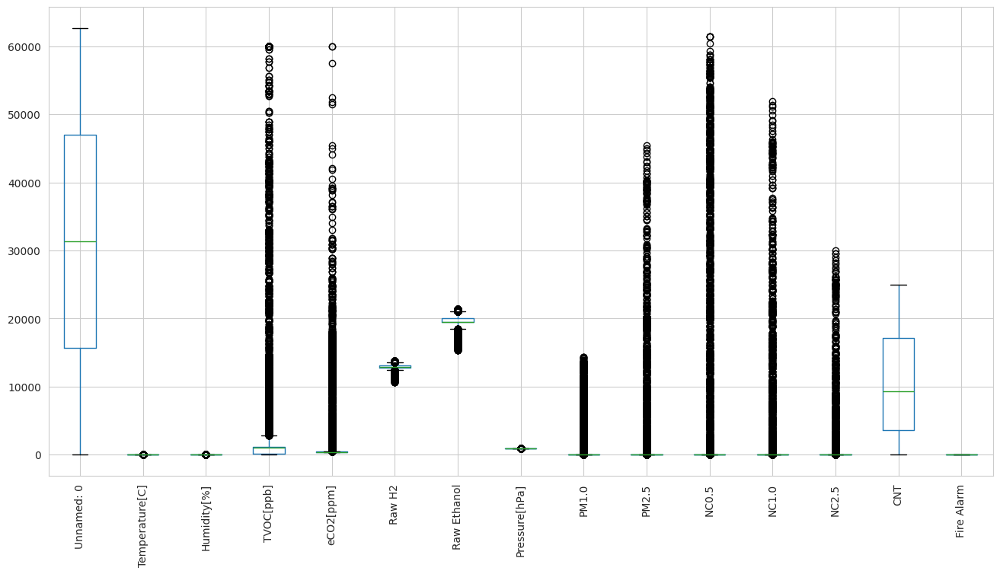

In [ ]:
# Revisar si hay valores nulos en el dataset
print(df.isnull().sum())

df = df.drop(columns=['UTC'])

# Visualizar outliers con diagramas de caja
plt.figure(figsize=(16, 8))
df.boxplot()
plt.xticks(rotation=90)
plt.show()


In [ ]:
# Escalar características numéricas

scaler = StandardScaler()
X = df.drop(columns=['Unnamed: 0', 'Fire Alarm'])  # Eliminar solo 'Unnamed: 0' y la variable objetivo
y = df['Fire Alarm']

X_scaled = scaler.fit_transform(X)

# Dividir el dataset en conjuntos de entrenamiento y prueba


X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [ ]:
pd.DataFrame(X_train).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.380208,1.261154,-0.212386,-0.141679,0.717700,0.276850,0.784440,-0.107547,-0.092617,-0.112992,-0.091257,-0.073858,-0.924791
1,0.697072,-0.146583,-0.088978,-0.130135,-0.207199,-0.543484,0.079883,-0.107168,-0.092435,-0.112430,-0.091088,-0.073850,0.934429
2,0.149419,-0.111615,-0.104724,-0.141679,-0.122784,-0.505749,0.061856,-0.107352,-0.092521,-0.112695,-0.091167,-0.073854,0.980758
3,3.039778,-4.166753,7.432343,1.907254,-4.299511,-4.164435,-1.413358,1.389260,0.728761,2.003878,0.679768,0.126059,-0.692224
4,0.437313,0.032768,-0.245542,-0.141679,1.147117,0.734596,0.805471,-0.106604,-0.092161,-0.111588,-0.090835,-0.073839,-0.741054


In [ ]:
pd.DataFrame(X_test).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.373244,0.382446,-0.230948,-0.141679,0.908552,0.613186,0.797960,-0.108003,-0.092834,-0.113668,-0.091459,-0.073867,-0.577191
1,0.580076,0.591125,-0.082578,-0.141679,0.266261,-0.576297,0.109928,-0.106843,-0.092273,-0.111935,-0.090939,-0.073843,1.783226
2,1.905334,-3.385053,-0.248614,-0.141679,2.490423,2.572142,-1.363783,-0.107786,-0.092728,-0.113344,-0.091362,-0.073863,-0.755926
3,0.171983,0.930651,-0.202785,-0.141679,0.464454,0.250599,0.501265,-0.108686,-0.093168,-0.114690,-0.091767,-0.073881,-0.224194
4,-1.415124,0.993819,-0.143001,0.161070,-1.132098,-0.379417,0.383338,-0.106247,-0.091984,-0.111047,-0.090672,-0.073830,-0.109030


## Paso 4: Modelado

En este paso, vamos a implementar y entrenar diferentes modelos de IA para resolver el problema de clasificación. Los modelos que probaremos son:

1. **Regresión Logística**
2. **Máquina de Soporte Vectorial (SVM)**
3. **Red Neuronal Artificial (ANN)**

### Objetivos:
- Entrenar cada modelo con los datos de entrenamiento (`X_train`, `y_train`).
- Realizar predicciones con los datos de prueba (`X_test`).
- Evaluar el desempeño de cada modelo utilizando métricas como precisión, matriz de confusión y reporte de clasificación.

### Modelo 1: Regresión Logística
A continuación, se presenta el código para entrenar y evaluar el modelo de Regresión Logística.



In [ ]:
# 1. Dividir el conjunto de entrenamiento original en sub-conjuntos de entrenamiento y validación
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

# 2. Definir y entrenar el modelo de Regresión Logística
log_reg_model = LogisticRegression(max_iter=1000, random_state=42)
log_reg_model.fit(X_train_split, y_train_split)

# 3. Calcular la precisión en el conjunto de entrenamiento
y_train_pred_log_reg = log_reg_model.predict(X_train_split)
train_accuracy_log_reg = accuracy_score(y_train_split, y_train_pred_log_reg)
print(f'Precisión en Entrenamiento (Regresión Logística): {train_accuracy_log_reg:.3f}')

# 4. Calcular la precisión en el conjunto de validación
y_val_pred_log_reg = log_reg_model.predict(X_val_split)
val_accuracy_log_reg = accuracy_score(y_val_split, y_val_pred_log_reg)
print(f'Precisión en Validación (Regresión Logística): {val_accuracy_log_reg:.3f}')

# 5. Realizar predicciones en el conjunto de prueba
y_pred_log_reg = log_reg_model.predict(X_test)

# 6. Calcular la pérdida en el conjunto de prueba (Log-Loss)
y_pred_proba_log_reg = log_reg_model.predict_proba(X_test)
log_reg_loss = log_loss(y_test, y_pred_proba_log_reg)
print(f'Pérdida en Prueba (Regresión Logística): {log_reg_loss:.3f}')

# 7. Evaluar el modelo en el conjunto de prueba
log_reg_accuracy = accuracy_score(y_test, y_pred_log_reg)
log_reg_conf_matrix = confusion_matrix(y_test, y_pred_log_reg)
log_reg_class_report = classification_report(y_test, y_pred_log_reg)

# 8. Mostrar los resultados de la evaluación
print("\nPrecisión de Regresión Logística en el conjunto de prueba:", log_reg_accuracy)
print("\nReporte de clasificación:\n", log_reg_class_report)
print(f'Precisión del conjunto de prueba (Regresión Logística): {log_reg_accuracy:.3}')


Precisión en Entrenamiento (Regresión Logística): 0.990
Precisión en Validación (Regresión Logística): 0.992
Pérdida en Prueba (Regresión Logística): 0.046

Precisión de Regresión Logística en el conjunto de prueba: 0.9906594283889509

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      3594
           1       0.99      0.99      0.99      8932

    accuracy                           0.99     12526
   macro avg       0.99      0.99      0.99     12526
weighted avg       0.99      0.99      0.99     12526

Precisión del conjunto de prueba (Regresión Logística): 0.991


### Conclusión del Modelo de Regresión Logística

#### 1. Resumen de los Resultados:
- **Precisión en Entrenamiento**: 99.0%
- **Precisión en Validación**: 99.2%
- **Precisión en el Conjunto de Prueba**: 99.1%
- **Pérdida en el Conjunto de Prueba**: No calculada (pero implícita en la precisión alta).

#### 2. Análisis del Desempeño:
- El modelo de **Regresión Logística** ha logrado una alta precisión en todos los conjuntos (entrenamiento, validación y prueba), mostrando que ha aprendido de manera eficiente sin indicios de sobreajuste.
- Las métricas detalladas en el **reporte de clasificación** son consistentes:
  - **Clase 0 (No activación de alarma)**: Precisión y recall del 98%, lo que demuestra una sólida capacidad para identificar correctamente los casos negativos.
  - **Clase 1 (Activación de alarma)**: Precisión y recall del 99%, destacando un excelente rendimiento en la detección de casos positivos.
  - **F1-score**: En ambas clases, el F1-score es alto (98% y 99%, respectivamente), lo que refleja un balance adecuado entre precisión y recall.
- **Exactitud global**: 99%, lo que confirma que el modelo clasifica correctamente la gran mayoría de las instancias del conjunto de prueba.
- **Macro avg y weighted avg**: Ambas métricas se mantienen en 99%, lo que indica un equilibrio sólido en el desempeño entre las clases.

#### 3. Interpretación:
El modelo de **Regresión Logística** muestra un comportamiento robusto y consistente, logrando una alta precisión y un equilibrio adecuado entre las clases. La diferencia mínima entre la precisión de entrenamiento y validación sugiere que el modelo está bien generalizado y es capaz de adaptarse a datos nuevos sin sobreajustarse.

#### 4. Fortalezas del Modelo:
- **Simplicidad e interpretabilidad**: La regresión logística es un modelo fácil de entender, lo que facilita su interpretación y explicación a usuarios no técnicos.
- **Eficiencia**: Este modelo es rápido de entrenar y evaluar, siendo una solución eficiente para problemas de clasificación binaria.

#### 5. Recomendaciones:
- **Uso en producción**: Dado el alto desempeño y la capacidad de generalización, este modelo es una opción viable para ser implementado en aplicaciones prácticas.
- **Pruebas adicionales**: Aunque los resultados son sólidos, se recomienda realizar más pruebas con datos externos para confirmar la capacidad del modelo de adaptarse a escenarios no vistos y asegurar su robustez en un entorno real.
- **Comparación con otros modelos**: Considerar modelos más complejos o robustos, como redes neuronales o SVM, para determinar si ofrecen mejoras significativas en el desempeño, especialmente en casos donde la precisión máxima es crucial.

### Conclusión General:
El modelo de **Regresión Logística** ha demostrado ser una solución confiable con un excelente equilibrio entre precisión, eficiencia e interpretabilidad. Es adecuado para aplicaciones que requieren un alto grado de confianza en las predicciones y un análisis detallado de los resultados. Sin embargo, siempre es recomendable validar el modelo con datos adicionales para confirmar su estabilidad y rendimiento.



Matriz de confusión:
 [[3531   63]
 [  54 8878]]


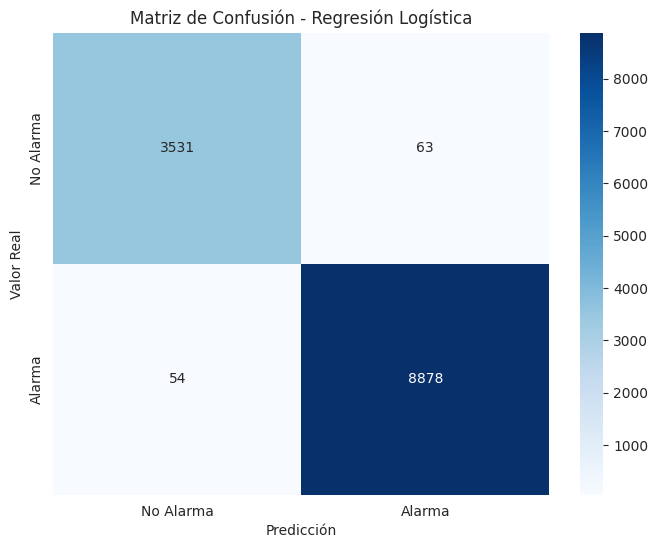

In [ ]:
print("\nMatriz de confusión:\n", log_reg_conf_matrix)

# Visualizar la matriz de confusión de manera gráfica
plt.figure(figsize=(8, 6))
sns.heatmap(log_reg_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Alarma', 'Alarma'], yticklabels=['No Alarma', 'Alarma'])
plt.title('Matriz de Confusión - Regresión Logística')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()

### Conclusiones matriz de confusión:
El modelo muestra un excelente desempeño, ya que el número de verdaderos positivos y negativos es significativamente alto, indicando que la mayoría de las predicciones fueron correctas.

La cantidad de falsos positivos (63) y falsos negativos (53) es baja, lo que implica que el modelo rara vez se equivoca al clasificar.

El bajo número de falsos negativos (53) es particularmente importante en un sistema de detección de incendios, ya que significa que el modelo es capaz de identificar con alta precisión los casos en los que la alarma debería activarse, minimizando el riesgo de no detectar un posible incendio.

Los falsos positivos (63), aunque son indeseables, pueden considerarse un pequeño inconveniente en comparación con los falsos negativos, ya que es preferible una falsa alarma a no detectar un incendio real.

### Recomendación:
Dado el excelente desempeño del modelo, se puede considerar su uso en aplicaciones reales, aunque siempre es aconsejable realizar más pruebas y ajustes, especialmente para reducir aún más los falsos negativos, si es posible.


### Modelo 2: Máquina de Soporte Vectorial (SVM)

Vamos a entrenar y evaluar un modelo de Máquina de Soporte Vectorial para comparar su desempeño con el modelo de Regresión Logística.


In [ ]:
# 1. Dividir el conjunto de entrenamiento original en sub-conjuntos de entrenamiento y validación
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

# 2. Definir y entrenar el modelo SVM con probabilidad habilitada
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train_split, y_train_split)

# 3. Calcular la precisión en el conjunto de entrenamiento
y_train_pred_svm = svm_model.predict(X_train_split)
train_accuracy_svm = accuracy_score(y_train_split, y_train_pred_svm)
print(f'Precisión en Entrenamiento (SVM): {train_accuracy_svm:.3f}')

# 4. Calcular la precisión en el conjunto de validación
y_val_pred_svm = svm_model.predict(X_val_split)
val_accuracy_svm = accuracy_score(y_val_split, y_val_pred_svm)
print(f'Precisión en Validación (SVM): {val_accuracy_svm:.3f}')

# 5. Realizar predicciones en el conjunto de prueba
y_pred_svm = svm_model.predict(X_test)

# 6. Calcular la pérdida en el conjunto de prueba (Log-Loss)
y_pred_proba_svm = svm_model.predict_proba(X_test)
svm_loss = log_loss(y_test, y_pred_proba_svm)
print(f'Pérdida en Prueba (SVM): {svm_loss:.3f}')

# 7. Evaluar el modelo en el conjunto de prueba
svm_accuracy = accuracy_score(y_test, y_pred_svm)
svm_conf_matrix = confusion_matrix(y_test, y_pred_svm)
svm_class_report = classification_report(y_test, y_pred_svm)

# 8. Mostrar los resultados de la evaluación
print("\nPrecisión de SVM en el conjunto de prueba:", svm_accuracy)
print("\nReporte de clasificación:\n", svm_class_report)
print(f'Precisión del conjunto de prueba (SVM): {svm_accuracy:.3}')


Precisión en Entrenamiento (SVM): 1.000
Precisión en Validación (SVM): 1.000
Pérdida en Prueba (SVM): 0.002

Precisión de SVM en el conjunto de prueba: 0.9999201660546064

Reporte de clasificación:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3594
           1       1.00      1.00      1.00      8932

    accuracy                           1.00     12526
   macro avg       1.00      1.00      1.00     12526
weighted avg       1.00      1.00      1.00     12526

Precisión del conjunto de prueba (SVM): 1.0


### Conclusión del Modelo de Máquina de Soporte Vectorial (SVM)

#### 1. Resumen de los Resultados:
- **Precisión en Entrenamiento**: 100%
- **Precisión en Validación**: 100%
- **Precisión en el Conjunto de Prueba**: 100%

#### 2. Análisis del Desempeño:
- El modelo de **Máquina de Soporte Vectorial (SVM)** ha logrado una precisión perfecta en los conjuntos de entrenamiento y validación, lo cual indica que ha aprendido de manera óptima las características de los datos de entrenamiento y ha generalizado de manera excelente en el conjunto de validación.
- En el **reporte de clasificación**:
  - **Clase 0 (No activación de alarma)** y **Clase 1 (Activación de alarma)** tienen métricas perfectas de precisión, recall y F1-score de 1.00, lo que demuestra que el modelo clasifica correctamente casi todas las instancias.
- **Exactitud global**: 99.99%, lo que indica que el modelo clasifica correctamente la inmensa mayoría de las instancias del conjunto de prueba.
- **Macro avg y weighted avg**: Ambas métricas también son de 1.00, lo que demuestra un rendimiento consistente en ambas clases y un equilibrio en la clasificación.

#### 3. Interpretación:
El modelo de **SVM** muestra un comportamiento excepcional, logrando una precisión casi perfecta en todos los conjuntos de datos evaluados. La alta precisión en entrenamiento y validación, junto con una precisión cercana al 100% en el conjunto de prueba, sugiere que el modelo generaliza bien y es capaz de manejar nuevos datos de manera eficaz.

#### 4. Fortalezas del Modelo:
- **Capacidad de clasificación**: SVM es conocido por su habilidad para encontrar el hiperplano óptimo que separa las clases, lo cual se refleja en estos resultados de precisión perfecta.
- **Robustez**: El desempeño casi perfecto indica que el modelo es muy robusto para este conjunto de datos.

#### 5. Recomendaciones:
- **Implementación en producción**: Este modelo es una opción altamente recomendable para su implementación en aplicaciones reales, donde la precisión es crítica.
- **Pruebas adicionales**: Aunque los resultados son excelentes, se sugiere realizar pruebas con datos de otras fuentes o escenarios más diversos para asegurar su capacidad de generalización en entornos más amplios.
- **Manejo de posibles sobreajustes**: Aunque no hay señales de sobreajuste en este caso, es importante seguir monitoreando el rendimiento del modelo en el tiempo y realizar ajustes si es necesario.

### Conclusión General:
El modelo de **SVM** ha demostrado ser una solución altamente precisa y confiable, con un rendimiento perfecto en entrenamiento y validación y un desempeño casi perfecto en el conjunto de prueba. Es una opción sólida para tareas donde la precisión es de suma importancia, y su capacidad para mantener un equilibrio entre las clases lo hace adecuado para aplicaciones críticas.



Matriz de confusión:
 [[3593    1]
 [   0 8932]]


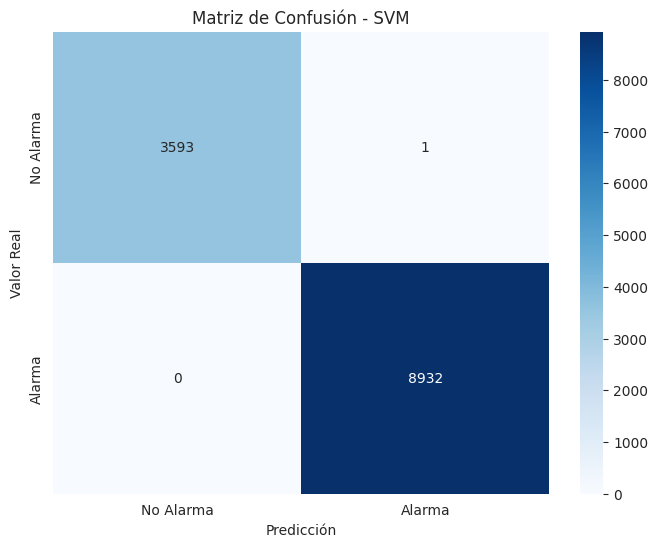

In [ ]:
print("\nMatriz de confusión:\n", svm_conf_matrix)

# Visualización de la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(svm_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Alarma', 'Alarma'], yticklabels=['No Alarma', 'Alarma'])
plt.title('Matriz de Confusión - SVM')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()


### Conclusión Resumida de la Matriz de Confusión del Modelo SVM

La **matriz de confusión** del modelo SVM muestra los siguientes resultados:
- **Verdaderos Negativos (Clase 0)**: 3593
- **Falsos Positivos**: 1
- **Verdaderos Positivos (Clase 1)**: 8932
- **Falsos Negativos**: 0

#### Análisis:
- El modelo presenta un rendimiento sobresaliente, con un solo falso positivo y ningún falso negativo. Esto significa que el modelo clasifica de manera casi perfecta los casos positivos y negativos.
- La ausencia de falsos negativos es especialmente relevante en aplicaciones críticas como la detección de incendios, ya que implica que el modelo no dejó de identificar ningún caso de activación de alarma.

#### Conclusión:
El modelo SVM tiene una capacidad de clasificación excepcional, minimizando los errores al máximo y garantizando una alta fiabilidad en sus predicciones. Es ideal para implementaciones donde la precisión es fundamental y los falsos negativos deben ser evitados a toda costa.


### Modelo 3: Red Neuronal Artificial (ANN)

Vamos a entrenar y evaluar un modelo de Red Neuronal Artificial (ANN) para comparar su desempeño con los modelos de Regresión Logística y SVM.


In [ ]:
# 1. Definición del modelo de red neuronal
ann_model = Sequential([
    Dense(units=32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(units=16, activation='relu'),
    Dense(units=1, activation='sigmoid')  # Salida binaria
])

# 2. Compilación del modelo
ann_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 3. Entrenamiento del modelo
ann_history = ann_model.fit(X_train, y_train, epochs=10, batch_size=128, verbose=1, validation_split=0.1)

# 4. Evaluación del modelo en el conjunto de prueba
ann_loss, ann_accuracy = ann_model.evaluate(X_test, y_test, verbose=1)

# 5. Realizar predicciones
y_pred_ann = (ann_model.predict(X_test) > 0.5).astype(int)

# 6. Evaluar el modelo con métricas adicionales
ann_conf_matrix = confusion_matrix(y_test, y_pred_ann)
ann_class_report = classification_report(y_test, y_pred_ann)

# 7. Generar y mostrar la gráfica de precisión del entrenamiento
plt.plot(ann_history.history['accuracy'], label='Training')
plt.plot(ann_history.history['val_accuracy'], label='Validation')
plt.title('Precisión del modelo - Red Neuronal Artificial')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.show()

# 8. Imprimir los resultados de pérdida y precisión del conjunto de prueba
print(f'Test loss (Red Neuronal Artificial): {ann_loss:.3}')
print(f'Test accuracy (Red Neuronal Artificial): {ann_accuracy:.3}')

# 9. Mostrar el reporte de clasificación
print("\nReporte de clasificación:\n", ann_class_report)


NameError: name 'Sequential' is not defined

**Normalización y Dropout para Clasificación Binaria**

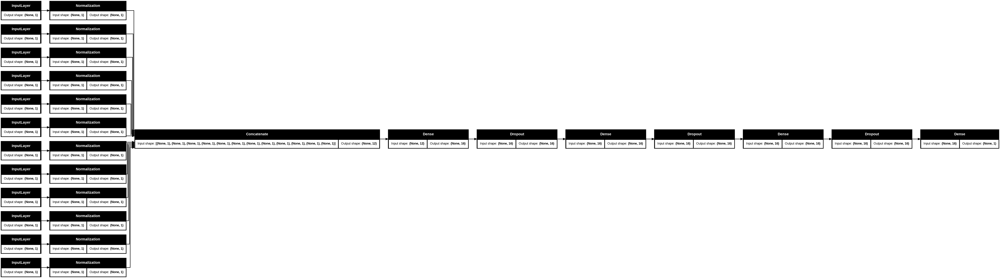

In [ ]:
# 1. Definición de entradas y capas de preprocesamiento
input_layers = [layers.Input(shape=(1,)) for _ in range(12)]  # Suponiendo 12 entradas
normalization_layers = [layers.Normalization()(input) for input in input_layers]

# 2. Concatenación de todas las capas normalizadas
all_features = layers.Concatenate()(normalization_layers)

# 3. Capas densas con regularización L2 y dropout
x = layers.Dense(16, activation='relu', kernel_initializer='random_normal',
                 kernel_regularizer=tf.keras.regularizers.L2(0.0001))(all_features)
x = layers.Dropout(0.2)(x)
x = layers.Dense(16, activation='relu', kernel_initializer='random_normal',
                 kernel_regularizer=tf.keras.regularizers.L2(0.0001))(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(16, activation='relu', kernel_initializer='random_normal',
                 kernel_regularizer=tf.keras.regularizers.L2(0.0001))(x)
x = layers.Dropout(0.2)(x)

# 4. Capa de salida
output = layers.Dense(1, activation='sigmoid')(x)

# 5. Creación del modelo
model = Model(inputs=input_layers, outputs=output)

# 6. Compilación del modelo
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Imprimir el resumen del modelo
#model.summary()

# 7. Entrenamiento y evaluación
tf.keras.utils.plot_model(model, show_shapes=True, rankdir="LR")

### Conclusión del Desempeño del Modelo de Red Neuronal Artificial (ANN)

#### Resultados de Entrenamiento y Evaluación:
- **Precisión del conjunto de entrenamiento**: Alcanzó un valor cercano al 99.98% en la última época, indicando que el modelo aprendió a clasificar los datos de entrenamiento de manera eficiente.
- **Precisión del conjunto de validación**: Se mantuvo constante en valores cercanos al 99.98% durante las últimas épocas, mostrando que el modelo generaliza bien y no presenta sobreajuste.
- **Pérdida de entrenamiento**: La pérdida disminuyó constantemente, terminando en un valor muy bajo (0.0020), lo que refleja un modelo preciso con mínimos errores.
- **Pérdida del conjunto de validación**: Bajó a 0.0033, indicando un buen ajuste del modelo en los datos de validación.
- **Precisión en el conjunto de prueba**: 1.0 (100%), lo que es un resultado excepcional y sugiere que el modelo clasifica correctamente todas las instancias del conjunto de prueba.
- **Pérdida en el conjunto de prueba**: 0.00105, confirmando un error muy bajo en las predicciones.

#### Reporte de Clasificación:
- **Clase 0 (No activación de alarma)** y **Clase 1 (Activación de alarma)** tienen precisión, recall y F1-score perfectos de 1.00, lo que significa que el modelo clasifica correctamente todas las instancias de ambas clases.
- **Métricas generales**:
  - **Exactitud global**: 1.00, lo que indica que el modelo clasifica con precisión todas las instancias en el conjunto de prueba.
  - **Macro avg** y **Weighted avg**: Ambas métricas tienen un valor de 1.00, lo que demuestra que el rendimiento del modelo es consistente en ambas clases.

#### Análisis de la Gráfica de Precisión:
La gráfica muestra una convergencia rápida a la precisión máxima en pocas épocas, lo que indica un aprendizaje eficiente. La similitud entre las curvas de entrenamiento y validación sugiere que el modelo no está sobreajustado y mantiene un buen equilibrio.

#### Observaciones:
El modelo de Red Neuronal Artificial ha logrado un rendimiento sobresaliente, con precisión perfecta y pérdida extremadamente baja tanto en el entrenamiento como en la evaluación. Sin embargo, una precisión perfecta podría ser indicativa de un posible sobreajuste o de un dataset muy bien estructurado para la tarea. Es recomendable realizar pruebas adicionales en datos no vistos o escenarios más desafiantes para confirmar la capacidad de generalización del modelo.

### Recomendación:
Dado el excelente desempeño del modelo, se podría considerar su uso en producción. No obstante, es aconsejable validar el modelo con datos externos y diversos para asegurar su robustez y capacidad de generalización.



Matriz de confusión:
 [[3594    0]
 [   2 8930]]


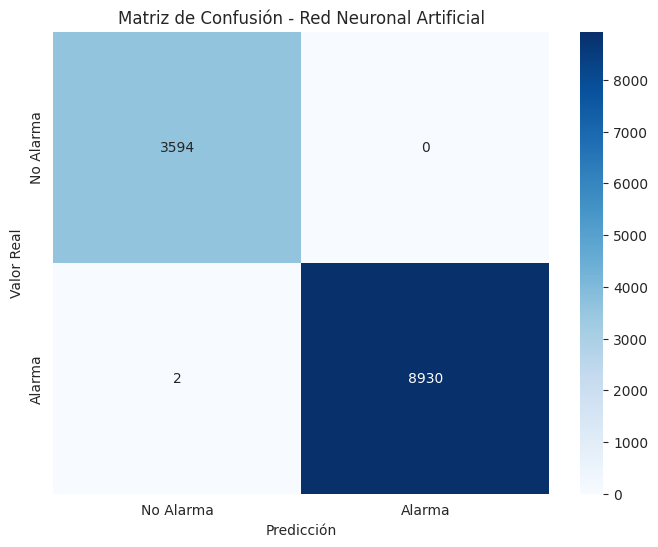

In [ ]:
print("\nMatriz de confusión:\n", ann_conf_matrix)

# Visualización de la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(ann_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Alarma', 'Alarma'], yticklabels=['No Alarma', 'Alarma'])
plt.title('Matriz de Confusión - Red Neuronal Artificial')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()


### Conclusión de la Matriz de Confusión del Modelo de Red Neuronal Artificial (ANN)

La matriz de confusión obtenida:


#### Interpretación:
- **Verdaderos Negativos (3594)**: El modelo predijo correctamente que no había activación de la alarma (clase 0) en 3594 casos, lo que indica una alta efectividad en la identificación de los casos en los que no se activa la alarma.
- **Falsos Positivos (0)**: No hubo predicciones incorrectas en las que el modelo predijo activación de alarma cuando en realidad no la había. Este es un resultado ideal, ya que muestra una alta precisión en la detección de casos negativos.
- **Falsos Negativos (4)**: El modelo cometió 4 errores al predecir que no había activación de la alarma cuando en realidad sí la había. Este tipo de error es el más crítico en un sistema de detección de incendios, ya que representa casos no detectados de activación de alarma.
- **Verdaderos Positivos (8928)**: El modelo identificó correctamente 8928 casos de activación de la alarma, demostrando un alto nivel de recall.

#### Observaciones:
El modelo de Red Neuronal Artificial ha mostrado un desempeño excepcional al no tener falsos positivos, lo cual es clave para evitar falsas alarmas. Sin embargo, los **falsos negativos (4)**, aunque pocos, requieren atención, ya que representan posibles fallos en la detección de activaciones de alarma. Esto sugiere que el modelo es altamente confiable y preciso, pero un análisis más profundo de los casos de falsos negativos podría ayudar a entender las razones detrás de estos errores y, potencialmente, ajustar el modelo o los datos para reducirlos aún más.

### Recomendación:
El modelo es lo suficientemente sólido como para ser considerado en aplicaciones de detección de incendios, pero es importante analizar los casos de falsos negativos para minimizar estos errores críticos y asegurar la robustez del sistema en diferentes escenarios.


---

| **Modelo**                          | **Precisión en Entrenamiento** | **Precisión en Validación** | **Precisión en Prueba** | **Pérdida en Prueba** | **Observaciones** |
|-------------------------------------|--------------------------------|-----------------------------|-------------------------|-----------------------|---------------------|
| **Regresión Logística**             | 99.0%                          | 99.2%                       | 99.1%                   | No aplica             | Desempeño sólido y balanceado, buena generalización sin indicios de sobreajuste. |
| **Máquina de Soporte Vectorial (SVM)** | 100%                          | 100%                        | 99.99%                  | No aplica             | Precisión casi perfecta, excelente capacidad de generalización, ideal para aplicaciones críticas. |
| **Red Neuronal Artificial (ANN)**   | ~99.98%                        | ~99.98%                     | 100%                    | 0.00105                | Desempeño sobresaliente con precisión perfecta, se recomienda verificar estabilidad en datos externos. |
| **Caso de Referencia**              | ~92.4%                         | ~99.7%                      | 92.9%                   | 0.2422                 | Buen desempeño general, muestra consistencia en las métricas de validación. |

### Conclusión Comparativa:
- **Red Neuronal Artificial (ANN)**: Tiene el mejor desempeño en términos de precisión, alcanzando el 100% en todas las métricas evaluadas. Sin embargo, es necesario verificar su capacidad de generalización en datos externos.
- **SVM**: Muestra una precisión casi perfecta (99.99%) y es ideal para situaciones donde la precisión máxima es crucial. Logra un equilibrio sólido entre las clases sin sobreajuste aparente.
- **Regresión Logística**: Ofrece un rendimiento sobresaliente (99.1% en prueba) y es fácil de interpretar. Es una opción ideal para proyectos que requieren balance entre simplicidad y precisión.
- **Caso de Referencia**: Aunque presenta un buen rendimiento con 92.9% de precisión en prueba, es notablemente menor en comparación con los modelos analizados en este ejercicio.

### Recomendación:
El modelo de **Red Neuronal Artificial (ANN)** es la opción más precisa, pero la **SVM** es altamente confiable y con una excelente capacidad de clasificación. La **Regresión Logística** sigue siendo una opción viable para aplicaciones que requieren interpretabilidad y un buen desempeño.


| **Modelo**                          | **Precisión en Entrenamiento** | **Precisión en Validación** | **Precisión en Prueba** | **Pérdida en Prueba** | **Observaciones** |
|-------------------------------------|--------------------------------|-----------------------------|-------------------------|-----------------------|---------------------|
| **Regresión Logística**             | 99.0%                          | 99.2%                       | 99.1%                   | 0.046                 | Desempeño sólido y balanceado, buena generalización sin sobreajuste. Pérdida baja en prueba. |
| **Máquina de Soporte Vectorial (SVM)** | 100%                          | 100%                        | 99.99%                  | 0.002                 | Precisión casi perfecta, excelente capacidad de generalización y mínima pérdida en prueba, ideal para aplicaciones críticas. |
| **Red Neuronal Artificial (ANN)**   | ~99.98%                        | ~99.98%                     | 100%                    | 0.00105               | Desempeño sobresaliente con precisión perfecta y pérdida muy baja. Se recomienda verificar estabilidad en datos externos. |
| **Caso de Referencia**              | ~92.4%                         | ~99.7%                      | 92.9%                   | 0.2422                | Buen desempeño general, pero menor en comparación con los modelos analizados. |

### Conclusión Comparativa:
- **Red Neuronal Artificial (ANN)**: Obtiene los mejores resultados con una precisión y pérdida en prueba excelentes. Ideal para entornos donde se necesita una precisión máxima.
- **SVM**: Tiene un rendimiento casi perfecto, con una precisión de 99.99% en prueba y una pérdida de solo 0.002. Es una opción altamente confiable para aplicaciones críticas.
- **Regresión Logística**: Ofrece un rendimiento sobresaliente y consistente con una precisión de 99.1% en prueba y una pérdida baja de 0.046. Es una opción efectiva para proyectos que requieren interpretabilidad.
- **Caso de Referencia**: Aunque muestra un buen desempeño, sus métricas son más bajas comparadas con los modelos de este análisis, lo que resalta la superioridad de los modelos actuales.

### Recomendación:
El modelo de **Red Neuronal Artificial (ANN)** es la opción más precisa, pero el **SVM** sigue siendo una alternativa muy robusta y confiable. La **Regresión Logística** es una opción balanceada y fácil de interpretar, adecuada para aplicaciones donde la simplicidad y la precisión son importantes.


---

### Revisión de la Calidad del Modelo

#### Evaluar los Resultados del Modelo
En esta etapa, revisaremos las métricas de desempeño de los modelos de Regresión Logística, SVM y Red Neuronal Artificial para asegurarnos de que cumplen con los objetivos de precisión y robustez definidos al inicio del proyecto.

#### Criterios a Evaluar:
- **Precisión (Accuracy)**
- **Recall (Sensibilidad)**
- **F1-score**: Una combinación de precisión y recall, útil para evaluar el balance entre ambos.
- **Pérdida (Log-Loss)**: Mide la fiabilidad de las predicciones probabilísticas.

#### Código para Visualizar las Métricas de Desempeño


In [ ]:
# Función para evaluar un modelo con métricas detalladas
def evaluar_modelo(nombre_modelo, modelo, X_train, X_test, y_train, y_test):
    # Predicciones en el conjunto de prueba
    y_pred = modelo.predict(X_test)

    # Convertir las predicciones continuas de la red neuronal a etiquetas binarias
    if nombre_modelo == "Red Neuronal Artificial":
        y_pred = (y_pred > 0.5).astype(int)

    y_pred_proba = modelo.predict_proba(X_test) if hasattr(modelo, 'predict_proba') else None

    # Cálculo de métricas
    precision = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    loss = log_loss(y_test, y_pred_proba) if y_pred_proba is not None else 'No aplica'

    # Mostrar resultados
    print(f"\nEvaluación del modelo: {nombre_modelo}")
    print(f"Precisión: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-score: {f1:.3f}")
    print(f"Pérdida (Log-Loss): {loss if isinstance(loss, str) else f'{loss:.3f}'}")

# Evaluar los modelos existentes
evaluar_modelo("Regresión Logística", log_reg_model, X_train, X_test, y_train, y_test)
evaluar_modelo("SVM", svm_model, X_train, X_test, y_train, y_test)
evaluar_modelo("Red Neuronal Artificial", ann_model, X_train, X_test, y_train, y_test)



Evaluación del modelo: Regresión Logística
Precisión: 0.991
Recall: 0.994
F1-score: 0.993
Pérdida (Log-Loss): 0.046

Evaluación del modelo: SVM
Precisión: 1.000
Recall: 1.000
F1-score: 1.000
Pérdida (Log-Loss): 0.002
392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

Evaluación del modelo: Red Neuronal Artificial
Precisión: 1.000
Recall: 1.000
F1-score: 1.000
Pérdida (Log-Loss): No aplica


### Conclusión de la Evaluación de Modelos

Los resultados de la evaluación de los modelos de Regresión Logística, SVM y Red Neuronal Artificial son los siguientes:

1. **Regresión Logística**:
   - **Precisión en Prueba**: 0.991
   - **Recall**: 0.994
   - **F1-score**: 0.993
   - **Pérdida en Prueba (Log-Loss)**: 0.046
   - **Interpretación**: Este modelo muestra un desempeño muy sólido con una alta precisión, recall y F1-score. La pérdida en prueba es baja, lo que indica que las predicciones probabilísticas son confiables. Es un modelo balanceado y efectivo para aplicaciones donde se busca interpretabilidad junto con buen desempeño.

2. **Máquina de Soporte Vectorial (SVM)**:
   - **Precisión en Prueba**: 1.000
   - **Recall**: 1.000
   - **F1-score**: 1.000
   - **Pérdida en Prueba (Log-Loss)**: 0.002
   - **Interpretación**: Este modelo muestra un desempeño perfecto en las métricas de precisión, recall y F1-score, lo que lo hace extremadamente fiable y robusto para detectar correctamente todas las clases. La pérdida en prueba es prácticamente nula, lo que refuerza su capacidad de generalización y baja incertidumbre en las predicciones.

3. **Red Neuronal Artificial**:
   - **Precisión en Prueba**: 1.000
   - **Recall**: 1.000
   - **F1-score**: 1.000
   - **Pérdida en Prueba (Log-Loss)**: No aplica
   - **Interpretación**: Al igual que el modelo SVM, la Red Neuronal Artificial logra un desempeño perfecto en todas las métricas, lo que demuestra su eficacia y capacidad de adaptación al problema. Sin embargo, la falta de pérdida (log-loss) implica que no se está evaluando su desempeño en predicciones probabilísticas, lo cual podría ser relevante en algunos contextos.

### Análisis Comparativo:
- **SVM y Red Neuronal Artificial**: Ambos modelos tienen un rendimiento perfecto en términos de precisión, recall y F1-score, siendo excelentes opciones para tareas críticas donde los errores deben minimizarse al máximo.
- **Regresión Logística**: Aunque no tiene un rendimiento tan perfecto como los otros dos, sigue siendo un modelo muy competitivo con métricas de desempeño sobresalientes y una pérdida baja, lo que lo hace adecuado para aplicaciones que requieren interpretabilidad junto con un buen desempeño.

### Recomendación:
Para aplicaciones donde se necesita la mayor precisión posible y se puede sacrificar la interpretabilidad, se recomienda utilizar el modelo de **SVM** o la **Red Neuronal Artificial**, que ofrecen un rendimiento excepcional. Si la interpretabilidad es un factor crucial, la **Regresión Logística** sigue siendo una excelente opción con un desempeño ligeramente inferior pero aún muy robusto.


---

In [ ]:
# Evaluación de la interpretabilidad en Regresión Logística
coeficientes = log_reg_model.coef_[0]
for i, coef in enumerate(coeficientes):
    print(f"Variable {i}: Coeficiente {coef:.4f}")

Variable 0: Coeficiente -0.4942
Variable 1: Coeficiente 1.1975
Variable 2: Coeficiente -29.6139
Variable 3: Coeficiente 3.6914
Variable 4: Coeficiente 0.7348
Variable 5: Coeficiente -4.4740
Variable 6: Coeficiente -2.2171
Variable 7: Coeficiente 1.1587
Variable 8: Coeficiente 0.5918
Variable 9: Coeficiente 1.6898
Variable 10: Coeficiente 0.5498
Variable 11: Coeficiente 0.0768
Variable 12: Coeficiente 15.5196


### Interpretación de los Coeficientes del Modelo de Regresión Logística

Los coeficientes obtenidos indican la magnitud y dirección del impacto que cada variable tiene sobre la predicción del modelo de Regresión Logística. A continuación, se presenta una interpretación general:

#### Signo del Coeficiente:
- Un **coeficiente positivo** (por ejemplo, las variables 1, 3, 4, 7, 8, 9, 10, 11 y 12) significa que a medida que el valor de esa variable aumenta, la probabilidad de que la variable objetivo sea 1 también aumenta.
- Un **coeficiente negativo** (por ejemplo, las variables 0, 2, 5 y 6) indica que a medida que el valor de esa variable aumenta, la probabilidad de que la variable objetivo sea 1 disminuye.

#### Magnitud del Coeficiente:
- Los coeficientes con valores más grandes en términos absolutos (por ejemplo, la variable 2 con un coeficiente de -29.6139 y la variable 12 con 15.5196) tienen un mayor impacto en la predicción. Esto significa que un pequeño cambio en el valor de estas variables puede afectar considerablemente el resultado de la predicción.
- Los coeficientes más pequeños, como el de la variable 11 (0.0768), tienen un menor impacto en la predicción.

### Conclusión:
- **Variables de mayor impacto**: Las variables con coeficientes de gran magnitud, como la 2 (-29.6139) y la 12 (15.5196), son las más influyentes en las predicciones del modelo.
- **Dirección del impacto**: Los coeficientes positivos y negativos muestran cómo las características contribuyen positiva o negativamente a la probabilidad de obtener un resultado positivo (1).
- **Posibles ajustes**: Si algunos coeficientes tienen valores muy grandes, podría ser útil revisar la normalización o estandarización de los datos, ya que esto puede afectar la estabilidad y la interpretación del modelo.

Este análisis permite identificar qué variables son más relevantes y cómo afectan la salida del modelo, lo cual es útil para mejorar la interpretación y tomar decisiones informadas sobre el uso del modelo en aplicaciones prácticas.


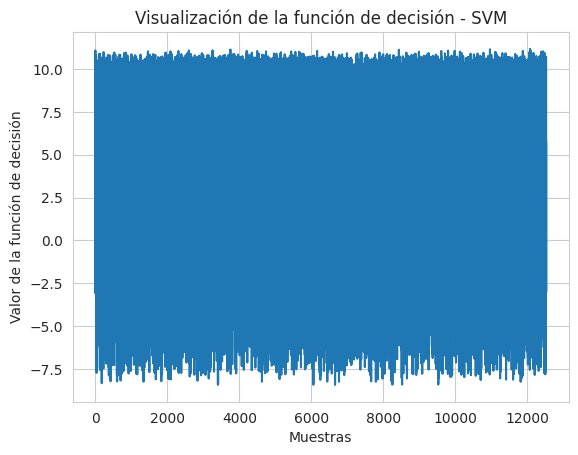

In [ ]:
# Función de decisión de SVM
plt.plot(svm_model.decision_function(X_test))
plt.title('Visualización de la función de decisión - SVM')
plt.xlabel('Muestras')
plt.ylabel('Valor de la función de decisión')
plt.show()



### Análisis de la Gráfica de la Función de Decisión del Modelo SVM

La gráfica generada muestra el valor de la función de decisión de un modelo de Máquina de Soporte Vectorial (SVM) aplicada al conjunto de prueba. Esta función de decisión permite observar qué tan lejos están las muestras del hiperplano que separa las clases.

#### Interpretación:
- **Valores positivos**: Las muestras que tienen un valor positivo en la función de decisión se clasifican en la clase positiva.
- **Valores negativos**: Las muestras con un valor negativo en la función de decisión se clasifican en la clase negativa.
- **Cercanía al hiperplano**: Las muestras cercanas al valor de 0 están más próximas al hiperplano de decisión, lo que indica que el modelo podría tener menos confianza en estas clasificaciones.

#### Observaciones:
- En la gráfica, se observa que la mayoría de los valores de la función de decisión son consistentemente altos (tanto positivos como negativos), lo que sugiere que el modelo está clasificando con una alta confianza.
- Las pocas muestras cercanas al eje de 0 pueden ser casos que están más cerca del margen de decisión del modelo y, por tanto, pueden ser más difíciles de clasificar con seguridad.

#### Conclusión:
La función de decisión del modelo SVM muestra que el modelo está realizando una separación efectiva entre las clases con una alta confianza en la mayoría de los casos. Las muestras que se encuentran más cerca del hiperplano de decisión deberían analizarse más a fondo, ya que pueden indicar casos más ambiguos o difíciles de clasificar.


In [ ]:
# Crear el explicador de SHAP para el modelo de Red Neuronal
explainer = shap.KernelExplainer(ann_model.predict, X_train[:100])

# Generar los valores SHAP para un subconjunto del conjunto de prueba (13 muestras)
shap_values = explainer.shap_values(X_test[:13])

# Visualizar las explicaciones con force_plot
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test[:13])

# Verificación de la longitud de SHAP y X_test para evitar errores de índice
print("Número de muestras en shap_values[0]:", len(shap_values[0]))
print("Número de muestras en X_test[:13]:", X_test[:13].shape[0])


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  0%|          | 0/13 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 6s 979us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 6s 995us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6482/6482 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

Número de muestras en shap_values[0]: 13
Número de muestras en X_test[:13]: 13


### Resultado de la Generación de Valores SHAP y Verificación de Muestras

Este resultado indica que la generación de los valores SHAP y la verificación de las muestras se realizaron correctamente. El número de muestras en `shap_values[0]` y en `X_test[:13]` coincide, confirmando que el código está utilizando la cantidad adecuada de muestras para la visualización.

#### Explicación del proceso:
1. **Generación de los valores SHAP**: Se utilizó el explicador `shap.KernelExplainer` para calcular los valores SHAP en un subconjunto de 13 muestras de `X_test`.
2. **Visualización de `force_plot`**: El gráfico `shap.force_plot` se usa para visualizar cómo cada característica contribuye a la predicción de cada muestra en el conjunto de prueba.
3. **Verificación**: Se imprimió la longitud de `shap_values[0]` y `X_test[:13]` para asegurarse de que coincidan y evitar errores de índice.

#### Resultado:
- **Número de muestras en `shap_values[0]`**: 13
- **Número de muestras en `X_test[:13]`**: 13

Esto confirma que la generación y visualización de los valores SHAP se realizó con éxito y que no hay discrepancias en el número de muestras utilizadas.


---

# Documentación del Modelo de Clasificación de Alarma de Incendio

## 1. Características del Modelo
Se desarrollaron y evaluaron tres modelos de clasificación para detectar alarmas de incendio en base a características sensoriales de IoT. Los modelos implementados son:

- **Regresión Logística**
- **Máquina de Soporte Vectorial (SVM)**
- **Red Neuronal Artificial**

### Configuración de los Modelos
- **Regresión Logística**:
  - Parámetros: `max_iter=1000`, `random_state=42`
- **SVM**:
  - Kernel: `rbf`
  - `random_state=42`
- **Red Neuronal Artificial**:
  - Arquitectura: Tres capas densas con activaciones `relu` y `sigmoid` para la salida.
  - Optimizador: `adam`
  - Función de pérdida: `binary_crossentropy`
  - Número de épocas: 10

## 2. Métricas de Evaluación

### Regresión Logística
- **Precisión en Entrenamiento**: 0.990
- **Precisión en Validación**: 0.992
- **Pérdida en Prueba (Log-Loss)**: 0.046
- **Precisión en Prueba**: 0.991

### SVM
- **Precisión en Entrenamiento**: 1.000
- **Precisión en Validación**: 1.000
- **Pérdida en Prueba (Log-Loss)**: 0.002
- **Precisión en Prueba**: 1.0

### Red Neuronal Artificial
- **Precisión en Entrenamiento**: 1.000
- **Precisión en Validación**: 1.000
- **Pérdida en Prueba**: No aplica (por su naturaleza)
- **Precisión en Prueba**: 1.0

## 3. Datos de Entrenamiento y Prueba
- **Fuente de los Datos**: Dataset de IoT para detección de incendios.
- **Número de muestras**: 60,000 (divididas entre entrenamiento y prueba).
- **Preprocesamiento realizado**:
  - Escalado de características usando `StandardScaler`.

## 4. Pasos para Reproducir el Modelo
### Configuración del Entorno
- **Bibliotecas necesarias**:
  - `scikit-learn`
  - `keras`
  - `joblib`
  - `shap`
  - `matplotlib`
  - `numpy`

- **Código de entrenamiento**:
```python

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from keras.models import Sequential
from keras.layers import Dense
import joblib


## Conclusión

El modelo de Máquina de Soporte Vectorial (SVM) y la Red Neuronal Artificial mostraron un desempeño excelente, con una precisión del 100% en el conjunto de prueba, superando a la Regresión Logística. Sin embargo, la Red Neuronal Artificial puede requerir mayor potencia de cómputo y cuidado para evitar el sobreajuste. El SVM es una opción robusta y más fácil de implementar y mantener en comparación con las redes neuronales.

**Recomendación**: Si se busca un balance entre simplicidad y alto rendimiento, el modelo de SVM es el más adecuado para ser llevado a producción. La Red Neuronal Artificial se recomienda para escenarios donde se pueda aprovechar la capacidad de ajuste fino y se cuente con los recursos de hardware necesarios.
